Import libraries

In [1]:
from numba import cuda 
device = cuda.get_current_device()
device.reset()

In [1]:
import tensorflow as tf
import tensorflow_io as tfio
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import os
from scipy.ndimage import distance_transform_edt
import tifffile
from tensorflow.keras.callbacks import ModelCheckpoint

2025-04-01 13:39:07.043899: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-01 13:39:07.052639: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-01 13:39:07.055391: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Set the input paths and parameters

In [3]:
train_input_path = "/home/khietdang/Documents/khiet/treeRing/tile_big_dis/train/x"
train_mask_path = "/home/khietdang/Documents/khiet/treeRing/tile_big_dis/train/y"
test_input_path = "/home/khietdang/Documents/khiet/treeRing/tile_big_dis/test/x"
test_mask_path = "/home/khietdang/Documents/khiet/treeRing/tile_big_dis/test/y"
model_path = "/home/khietdang/Documents/khiet/tree-ring-analyzer/src/models"

Get the paths of the images and masks

In [4]:
train_input_paths = [os.path.join(train_input_path, path) for path in os.listdir(train_input_path) if path.endswith(".tif")]
train_mask_paths = [os.path.join(train_mask_path, path) for path in os.listdir(train_mask_path) if path.endswith(".tif")]
print("Input images: " + str(len(train_input_paths)))
print("Input masks: " + str(len(train_mask_paths)))
print("---")
test_input_paths = [os.path.join(test_input_path, path) for path in os.listdir(test_input_path) if path.endswith(".tif")]
test_mask_paths = [os.path.join(test_mask_path, path) for path in os.listdir(test_mask_path) if path.endswith(".tif")]
print("Test images: " + str(len(test_input_paths)))
print("Test masks: " + str(len(test_mask_paths)))
train_path_dataset = tf.data.Dataset.from_tensor_slices((train_input_paths, train_mask_paths))
test_path_dataset = tf.data.Dataset.from_tensor_slices((test_input_paths, test_mask_paths))


Input images: 10775
Input masks: 10775
---
Test images: 2653
Test masks: 2653


I0000 00:00:1743437986.051265  163590 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1743437986.073923  163590 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1743437986.074045  163590 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1743437986.077064  163590 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [5]:
for pair in train_path_dataset.take(1):
    print(pair)

(<tf.Tensor: shape=(), dtype=string, numpy=b'/home/khietdang/Documents/khiet/treeRing/tile_big_dis/train/x/5Tmilieu8microns_x40_r0007_c0018.tif'>, <tf.Tensor: shape=(), dtype=string, numpy=b'/home/khietdang/Documents/khiet/treeRing/tile_big_dis/train/y/5Tmilieu8microns_x40_r0007_c0018.tif'>)


We define a function to read image/mask pairs.

In [6]:
def read_images(img_path, label_path):
    def _load_image(path):
        path = path.numpy().decode("utf-8")  # Convert TensorFlow tensor to Python string
        img = tifffile.imread(path)  # Read TIFF image
        img = img.astype(np.float32)  # Convert image to float32 for TensorFlow compatibility
        return img

    img = tf.py_function(func=_load_image, inp=[img_path], Tout=tf.float32)  # Use tf.py_function
    img.set_shape([None, None, None])  # Set output shape for TensorFlow dataset compatibility

    seg = tf.py_function(func=_load_image, inp=[label_path], Tout=tf.float32)  # Use tf.py_function
    seg.set_shape([None, None, None])  # Set output shape for TensorFlow dataset compatibility

    return img / 255, seg

Normalize images and masks.

We create a dataset containing pairs of images/masks.

In [7]:
train_dataset = train_path_dataset.map(lambda img_path, label: (read_images(img_path, label)), num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_path_dataset.map(lambda img_path, label: (read_images(img_path, label)), num_parallel_calls=tf.data.AUTOTUNE)

Trying to compensate for class imbalance.

Build train and validation batches.

In [8]:
BATCH_SIZE = 8
BUFFER_SIZE = 512
VALIDATION_SIZE = int(round((len(train_dataset) * 20) / 100))
print("validation data size: " + str(VALIDATION_SIZE))
print("train data size: " + str(len(train_dataset) - VALIDATION_SIZE))
validation_batches = train_dataset.take(VALIDATION_SIZE).batch(BATCH_SIZE)
train_batches = train_dataset.skip(VALIDATION_SIZE)
train_batches = train_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_batches = train_batches.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

validation data size: 2155
train data size: 8620


In [9]:
train_dataset.take(1)
print(type(train_dataset))

<class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>


In [10]:
data = train_dataset.take(1)
mask = data.get_single_element()[1]
mask

<tf.Tensor: shape=(256, 256, 1), dtype=float32, numpy=
array([[[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       ...,

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]]], dtype=float32)>

Display some random examples of pairs of input tiles and mask tiles.

(256, 256, 3)
(256, 256, 1)
tf.Tensor(1.0, shape=(), dtype=float32) tf.Tensor(0.05882353, shape=(), dtype=float32)
tf.Tensor(12.1640625, shape=(), dtype=float32) tf.Tensor(0.0, shape=(), dtype=float32)


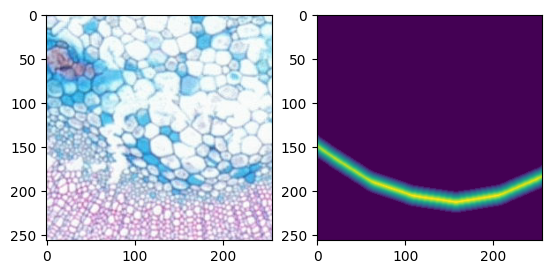

(256, 256, 3)
(256, 256, 1)
tf.Tensor(1.0, shape=(), dtype=float32) tf.Tensor(0.27450982, shape=(), dtype=float32)
tf.Tensor(10.6328125, shape=(), dtype=float32) tf.Tensor(0.0, shape=(), dtype=float32)


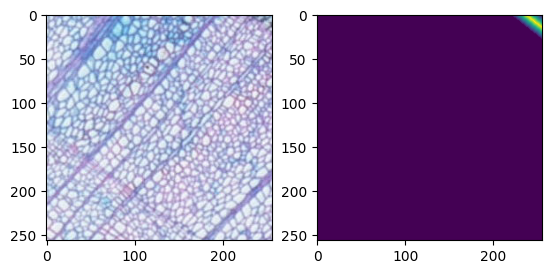

(256, 256, 3)
(256, 256, 1)
tf.Tensor(1.0, shape=(), dtype=float32) tf.Tensor(0.2, shape=(), dtype=float32)
tf.Tensor(12.1640625, shape=(), dtype=float32) tf.Tensor(0.0, shape=(), dtype=float32)


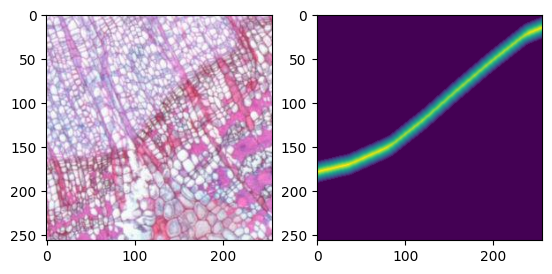

In [11]:
import matplotlib.pyplot as plt
N = 3
for image, mask in train_dataset.shuffle(len(train_dataset)).take(N):
    print(image.shape)
    print(mask.shape)
    print(tf.reduce_max(image), tf.reduce_min(image))
    print(tf.reduce_max(mask), tf.reduce_min(mask))
    fig, (ax1, ax2) = plt.subplots(1, 2)
    ax1.imshow(image)
    ax2.imshow(mask[:, :, 0])
    plt.show()

Building blocks for the UNet.

In [ ]:
def double_conv_block(x, n_filters):
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   return x

def downsample_block(x, n_filters):
   f = double_conv_block(x, n_filters)
   p = layers.MaxPool2D(2)(f)
   p = layers.Dropout(0.3)(p)
   return f, p

def attention_gate(g, s, num_filters):
    Wg = layers.Conv2D(num_filters, 3, padding="same")(g)
    Wg = layers.BatchNormalization()(Wg)
 
    Ws = layers.Conv2D(num_filters, 3, padding="same")(s)
    Ws = layers.BatchNormalization()(Ws)
 
    out = layers.Activation("relu")(Wg + Ws)
    out = layers.Conv2D(num_filters, 3, padding="same")(out)
    out = layers.Activation("sigmoid")(out)
 
    return out * s
    
def upsample_block(x, conv_features, n_filters):
   # upsample
   x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
   # s = attention_gate(x, conv_features, n_filters)
   # concatenate
   # x = layers.concatenate([x, s])
   x = layers.concatenate([x, conv_features])
   # dropout
   x = layers.Dropout(0.3)(x)
   # Conv2D twice with ReLU activation
   x = double_conv_block(x, n_filters)
   return x

Function that builds the UNet

In [9]:
def build_unet_model(input_channel, filter, activation):
   inputs = layers.Input(shape=(256,256,input_channel))
   # encoder: contracting path - downsample
   # 1 - downsample
   f1, p1 = downsample_block(inputs, filter[0])
   # 2 - downsample
   f2, p2 = downsample_block(p1, filter[1])

   # 3 - downsample
   f3, p3 = downsample_block(p2, filter[2])
   # 4 - downsample
   f4, p4 = downsample_block(p3, filter[3])
   # 5 - bottleneck
   bottleneck = double_conv_block(p4, filter[4])
   # decoder: expanding path - upsample
   # 6 - upsample
   u6 = upsample_block(bottleneck, f4, filter[3])
   # 7 - upsample
   u7 = upsample_block(u6, f3, filter[2])
   # 8 - upsample
   u8 = upsample_block(u7, f2, filter[1])
   # 9 - upsample
   u9 = upsample_block(u8, f1, filter[0])
   # outputs
   outputs = layers.Conv2D(1, (1,1), padding="same", activation = activation)(u9)
   # unet model with Keras Functional API
   unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
   return unet_model   

Build the UNet.

In [14]:
unet_model = build_unet_model(input_channel=1, filter=[7, 14, 28, 56, 112], activation='linear')

In [15]:
unet_model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_124 (Conv2D) │ (None, 256, 256,  │         70 │ input_layer_4[0]… │
│                     │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_125 (Conv2D) │ (None, 256, 256,  │        448 │ conv2d_124[0][0]  │
│                     │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 128, 128,  │          0 │ conv2d_125[0][0]  │
│ (MaxPooling2D)      │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_32          │ (None, 128, 128,  │          0 │ max_pooling2d_16… │
│ (Dropout)           │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_126 (Conv2D) │ (None, 128, 128,  │        896 │ dropout_32[0][0]  │
│                     │ 14)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_127 (Conv2D) │ (None, 128, 128,  │      1,778 │ conv2d_126[0][0]  │
│                     │ 14)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_17    │ (None, 64, 64,    │          0 │ conv2d_127[0][0]  │
│ (MaxPooling2D)      │ 14)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_33          │ (None, 64, 64,    │          0 │ max_pooling2d_17… │
│ (Dropout)           │ 14)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_128 (Conv2D) │ (None, 64, 64,    │      3,556 │ dropout_33[0][0]  │
│                     │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_129 (Conv2D) │ (None, 64, 64,    │      7,084 │ conv2d_128[0][0]  │
│                     │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_18    │ (None, 32, 32,    │          0 │ conv2d_129[0][0]  │
│ (MaxPooling2D)      │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_34          │ (None, 32, 32,    │          0 │ max_pooling2d_18… │
│ (Dropout)           │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_130 (Conv2D) │ (None, 32, 32,    │     14,168 │ dropout_34[0][0]  │
│                     │ 56)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_131 (Conv2D) │ (None, 32, 32,    │     28,280 │ conv2d_130[0][0]  │
│                     │ 56)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_19    │ (None, 16, 16,    │          0 │ conv2d_131[0][0]  │
│ (MaxPooling2D)      │ 56)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_35          │ (None, 16, 16,    │          0 │ max_pooling2d_19

 Total params: 527,206 (2.01 MB)

 Trainable params: 526,786 (2.01 MB)

 Non-trainable params: 420 (1.64 KB)

Alternatively build the unet from the predifined keras models.

Define a loss function that is a weighted sum of dice and binary cross entropy.

Create an image of the UNet architecture.

In [17]:
keras.utils.plot_model(unet_model, show_shapes=True)
"model.png written"

You must install pydot (`pip install pydot`) for `plot_model` to work.


'model.png written'

Compile the model.

In [14]:
unet_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='mse',
                  metrics=['accuracy', 'precision', 'recall', 'mse'])

Train the model.

In [15]:
checkpoint_callback = ModelCheckpoint(
    'best_model.h5',  # Filename
    monitor='val_loss',  # Metric to monitor
    save_best_only=True,  # Save only if it improves
    mode='min',  # Minimize the loss
    verbose=1
)

checkpoint_callback1 = ModelCheckpoint(
    'best_model.keras',  # Filename
    monitor='val_loss',  # Metric to monitor
    save_best_only=True,  # Save only if it improves
    mode='min',  # Minimize the loss
    verbose=1
)

NUM_EPOCHS = 100
keras.config.disable_traceback_filtering()
STEPS_PER_EPOCH = len(train_dataset) // BATCH_SIZE
VAL_SUBSPLITS = 5
VAL_LENGTH = VALIDATION_SIZE
VALIDATION_STEPS = VAL_LENGTH // BATCH_SIZE // VAL_SUBSPLITS
model_history = unet_model.fit(train_batches,
                              epochs=NUM_EPOCHS,
                              steps_per_epoch=STEPS_PER_EPOCH,
                              validation_steps=VALIDATION_STEPS,
                              validation_data=validation_batches, 
                              verbose=2,
                              callbacks=[checkpoint_callback, checkpoint_callback1]
                              )

Epoch 1/100


I0000 00:00:1743438015.802932  163738 service.cc:146] XLA service 0x706e4c004240 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1743438015.802948  163738 service.cc:154]   StreamExecutor device (0): NVIDIA RTX 4000 Ada Generation Laptop GPU, Compute Capability 8.9
I0000 00:00:1743438040.405126  163738 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.



Epoch 1: val_loss improved from inf to 2.90708, saving model to best_model.h5



Epoch 1: val_loss improved from inf to 2.90708, saving model to best_model.keras
1346/1346 - 370s - 275ms/step - accuracy: 0.7601 - loss: 8.7408 - mse: 8.7408 - precision: 0.1759 - recall: 0.5522 - val_accuracy: 0.8383 - val_loss: 2.9071 - val_mse: 2.9071 - val_precision: 0.2201 - val_recall: 0.3658
Epoch 2/100

Epoch 2: val_loss did not improve from 2.90708

Epoch 2: val_loss did not improve from 2.90708
1346/1346 - 340s - 252ms/step - accuracy: 0.7794 - loss: 2.6244 - mse: 2.6244 - precision: 0.2018 - recall: 0.5816 - val_accuracy: 0.1223 - val_loss: 25.1076 - val_mse: 25.1076 - val_precision: 0.0789 - val_recall: 0.9799
Epoch 3/100

Epoch 3: val_loss did not improve from 2.90708

Epoch 3: val_loss did not improve from 2.90708
1346/1346 - 318s - 236ms/step - accuracy: 0.7965 - loss: 2.3160 - mse: 2.3160 - precision: 0.2404 - recall: 0.6491 - val_accuracy: 0.9282 - val_loss: 3.2343 - val_mse: 3.2343 - val_precision: 0.7047 - val_recall: 0.0267
Epoch 4/100

Epoch 4: val_loss improved 


Epoch 4: val_loss improved from 2.90708 to 2.47213, saving model to best_model.keras
1346/1346 - 320s - 238ms/step - accuracy: 0.8251 - loss: 2.0022 - mse: 2.0022 - precision: 0.3008 - recall: 0.7011 - val_accuracy: 0.8772 - val_loss: 2.4721 - val_mse: 2.4721 - val_precision: 0.3779 - val_recall: 0.4558
Epoch 5/100

Epoch 5: val_loss improved from 2.47213 to 2.38068, saving model to best_model.h5



Epoch 5: val_loss improved from 2.47213 to 2.38068, saving model to best_model.keras
1346/1346 - 319s - 237ms/step - accuracy: 0.8473 - loss: 1.7216 - mse: 1.7216 - precision: 0.3648 - recall: 0.7470 - val_accuracy: 0.7774 - val_loss: 2.3807 - val_mse: 2.3807 - val_precision: 0.2396 - val_recall: 0.6853
Epoch 6/100

Epoch 6: val_loss improved from 2.38068 to 2.25220, saving model to best_model.h5



Epoch 6: val_loss improved from 2.38068 to 2.25220, saving model to best_model.keras
1346/1346 - 319s - 237ms/step - accuracy: 0.8582 - loss: 1.5566 - mse: 1.5566 - precision: 0.4055 - recall: 0.7789 - val_accuracy: 0.8926 - val_loss: 2.2522 - val_mse: 2.2522 - val_precision: 0.4845 - val_recall: 0.5048
Epoch 7/100

Epoch 7: val_loss did not improve from 2.25220

Epoch 7: val_loss did not improve from 2.25220
1346/1346 - 318s - 236ms/step - accuracy: 0.8658 - loss: 1.4600 - mse: 1.4600 - precision: 0.4343 - recall: 0.7931 - val_accuracy: 0.9031 - val_loss: 2.6716 - val_mse: 2.6716 - val_precision: 0.4879 - val_recall: 0.3645
Epoch 8/100

Epoch 8: val_loss improved from 2.25220 to 2.10563, saving model to best_model.h5



Epoch 8: val_loss improved from 2.25220 to 2.10563, saving model to best_model.keras
1346/1346 - 319s - 237ms/step - accuracy: 0.8703 - loss: 1.4009 - mse: 1.4009 - precision: 0.4547 - recall: 0.8030 - val_accuracy: 0.8283 - val_loss: 2.1056 - val_mse: 2.1056 - val_precision: 0.3168 - val_recall: 0.6750
Epoch 9/100

Epoch 9: val_loss did not improve from 2.10563

Epoch 9: val_loss did not improve from 2.10563
1346/1346 - 318s - 236ms/step - accuracy: 0.8733 - loss: 1.3510 - mse: 1.3510 - precision: 0.4677 - recall: 0.8110 - val_accuracy: 0.9159 - val_loss: 2.6432 - val_mse: 2.6432 - val_precision: 0.6293 - val_recall: 0.3376
Epoch 10/100

Epoch 10: val_loss did not improve from 2.10563

Epoch 10: val_loss did not improve from 2.10563
1346/1346 - 318s - 236ms/step - accuracy: 0.8767 - loss: 1.2965 - mse: 1.2965 - precision: 0.4846 - recall: 0.8207 - val_accuracy: 0.8833 - val_loss: 2.3557 - val_mse: 2.3557 - val_precision: 0.4474 - val_recall: 0.5438
Epoch 11/100

Epoch 11: val_loss di


Epoch 15: val_loss improved from 2.10563 to 2.03467, saving model to best_model.keras
1346/1346 - 319s - 237ms/step - accuracy: 0.8845 - loss: 1.1544 - mse: 1.1544 - precision: 0.5270 - recall: 0.8451 - val_accuracy: 0.7333 - val_loss: 2.0347 - val_mse: 2.0347 - val_precision: 0.2349 - val_recall: 0.8632
Epoch 16/100

Epoch 16: val_loss improved from 2.03467 to 1.89197, saving model to best_model.h5



Epoch 16: val_loss improved from 2.03467 to 1.89197, saving model to best_model.keras
1346/1346 - 319s - 237ms/step - accuracy: 0.8854 - loss: 1.1357 - mse: 1.1357 - precision: 0.5323 - recall: 0.8481 - val_accuracy: 0.8400 - val_loss: 1.8920 - val_mse: 1.8920 - val_precision: 0.3605 - val_recall: 0.7288
Epoch 17/100

Epoch 17: val_loss did not improve from 1.89197

Epoch 17: val_loss did not improve from 1.89197
1346/1346 - 318s - 236ms/step - accuracy: 0.8872 - loss: 1.1119 - mse: 1.1119 - precision: 0.5412 - recall: 0.8508 - val_accuracy: 0.9255 - val_loss: 2.7035 - val_mse: 2.7035 - val_precision: 0.8129 - val_recall: 0.2631
Epoch 18/100

Epoch 18: val_loss improved from 1.89197 to 1.87195, saving model to best_model.h5



Epoch 18: val_loss improved from 1.89197 to 1.87195, saving model to best_model.keras
1346/1346 - 319s - 237ms/step - accuracy: 0.8879 - loss: 1.0953 - mse: 1.0953 - precision: 0.5464 - recall: 0.8531 - val_accuracy: 0.8995 - val_loss: 1.8719 - val_mse: 1.8719 - val_precision: 0.5883 - val_recall: 0.6395
Epoch 19/100

Epoch 19: val_loss did not improve from 1.87195

Epoch 19: val_loss did not improve from 1.87195
1346/1346 - 318s - 236ms/step - accuracy: 0.8892 - loss: 1.0803 - mse: 1.0803 - precision: 0.5528 - recall: 0.8550 - val_accuracy: 0.9196 - val_loss: 2.5023 - val_mse: 2.5023 - val_precision: 0.6993 - val_recall: 0.3474
Epoch 20/100

Epoch 20: val_loss improved from 1.87195 to 1.49282, saving model to best_model.h5



Epoch 20: val_loss improved from 1.87195 to 1.49282, saving model to best_model.keras
1346/1346 - 319s - 237ms/step - accuracy: 0.8899 - loss: 1.0660 - mse: 1.0660 - precision: 0.5571 - recall: 0.8567 - val_accuracy: 0.8602 - val_loss: 1.4928 - val_mse: 1.4928 - val_precision: 0.4422 - val_recall: 0.8050
Epoch 21/100

Epoch 21: val_loss did not improve from 1.49282

Epoch 21: val_loss did not improve from 1.49282
1346/1346 - 318s - 237ms/step - accuracy: 0.8910 - loss: 1.0483 - mse: 1.0483 - precision: 0.5648 - recall: 0.8587 - val_accuracy: 0.5115 - val_loss: 3.0800 - val_mse: 3.0800 - val_precision: 0.1298 - val_recall: 0.8856
Epoch 22/100

Epoch 22: val_loss did not improve from 1.49282

Epoch 22: val_loss did not improve from 1.49282
1346/1346 - 318s - 236ms/step - accuracy: 0.8913 - loss: 1.0400 - mse: 1.0400 - precision: 0.5652 - recall: 0.8611 - val_accuracy: 0.6254 - val_loss: 2.2599 - val_mse: 2.2599 - val_precision: 0.1745 - val_recall: 0.9166
Epoch 23/100

Epoch 23: val_los

Save a model.

In [18]:
import datetime
date = datetime.datetime.now()
unet_model.save(os.path.join(model_path, str(date) + ".keras"))

Save the weights only.

In [19]:
import datetime
date = datetime.datetime.now()
unet_model.save(os.path.join(model_path,  str(date) + ".h5"))

In [16]:
import json
json.dump(model_history.history, open('/home/khietdang/Documents/khiet/tree-ring-analyzer/src/history/bigDistance2.json', 'w'))

In [18]:
print(model_history.history.keys())

dict_keys(['accuracy', 'loss', 'mse', 'precision', 'recall', 'val_accuracy', 'val_loss', 'val_mse', 'val_precision', 'val_recall'])


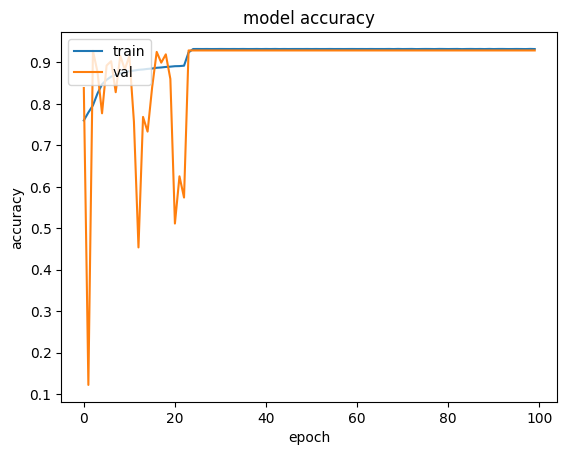

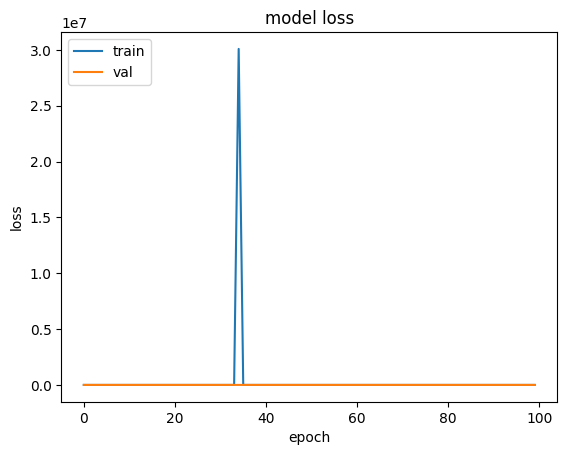

In [17]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Load a saved model

In [21]:
model = "2025-03-10 08:15:16.877547.keras"
path = os.path.join(model_path, model)
unet_model = keras.models.load_model(path)

Load the weights only.

In [48]:
model = '2025-03-06 14:41:50.401830.weights.h5'
path = os.path.join(model_path, model)
unet_model.load_weights(path)

Evaluate model on test data.

In [49]:
test_batches = train_dataset.take(len(test_dataset)).batch(BATCH_SIZE)
score = unet_model.evaluate(test_batches, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.6888464689254761
Test accuracy: 0.0


# Apply the model to an image.

Functions to read and prepare single images.

In [22]:
def read_image(img_path):
    img_data = tf.io.read_file(img_path)
    img = tfio.experimental.image.decode_tiff(img_data)
    img = img[:,:,0:3]
    return img

def prepare_image(img):   
    img = tf.image.convert_image_dtype(img, "float32") # This also scales to [O,1)
    return img


Create a dataset with patches of one image.

In [23]:
import tensorflow_io as tfio
import matplotlib.pyplot as plt
import cv2

image_file = '/home/khietdang/Documents/khiet/treeRing/input/4 E 1 m_8µm_x50.tif'
output_file = '/home/khietdang/Documents/khiet/treeRing/masks/4 E 1 m_8µm_x50.tif'
image_path_dataset = tf.data.Dataset.from_tensor_slices([image_file])
image_dataset = image_path_dataset.map(read_image, num_parallel_calls=tf.data.AUTOTUNE).map(prepare_image, num_parallel_calls=tf.data.AUTOTUNE)



ksize_rows = 256
ksize_cols = 256
strides_rows = 196
strides_cols = 196


# image = ds # tfio.experimental.image.decode_tiff(image_data)

# print(image)
# The size of sliding window
ksizes = [1, ksize_rows, ksize_cols, 1] 

# How far the centers of 2 consecutive patches are in the image
strides = [1, strides_rows, strides_cols, 1]

# The document is unclear. However, an intuitive example posted on StackOverflow illustrate its behaviour clearly. 
# http://stackoverflow.com/questions/40731433/understanding-tf-extract-image-patches-for-extracting-patches-from-an-image
rates = [1, 1, 1, 1] # sample pixel consecutively

# padding algorithm to used
padding='SAME' # or 'SAME'

# image = tf.expand_dims(image, 0)
image_patches = tf.image.extract_patches(images=list(image_dataset.take(1)), sizes=ksizes, strides=strides, rates=rates, padding=padding)


2025-03-10 17:16:50.477795: I tensorflow_io/core/kernels/cpu_check.cc:128] Your CPU supports instructions that this TensorFlow IO binary was not compiled to use: SSE3 SSE4.1 SSE4.2 AVX AVX2 FMA
TIFFReadDirectory: Warning, Unknown field with tag 50838 (0xc696) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50839 (0xc697) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50838 (0xc696) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50839 (0xc697) encountered.


Display the input patches.

26 24


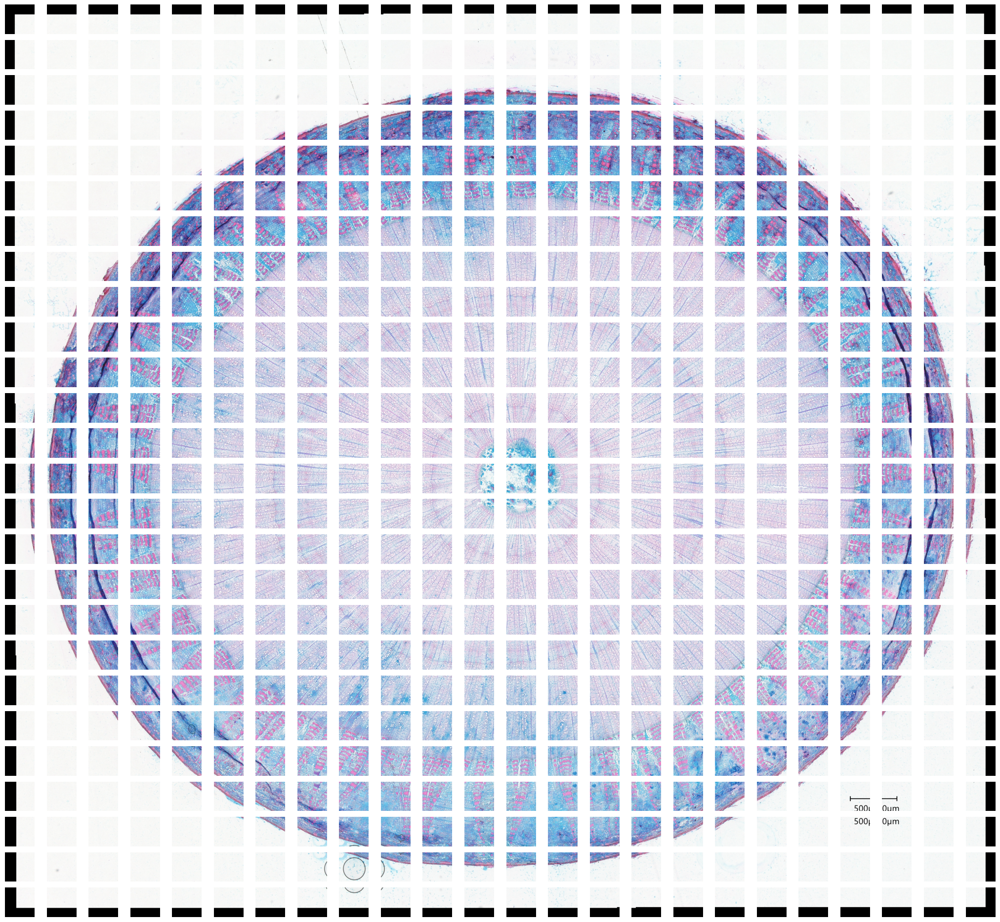

In [24]:
columns = image_patches.shape[1]
rows = image_patches.shape[2]

print(columns, rows)
# retrieve the 1st patches
fig = plt.figure(figsize=(columns, rows)) 
fig.tight_layout()
i = 1
for col in range(columns):
    for row in range(rows):
        patch = image_patches[0,col,row,]
        patch = tf.reshape(patch, [ksize_rows, ksize_cols, 3])        
        fig.add_subplot(columns, rows, i) 
        plt.axis('off') 
        plt.imshow(patch)
        i = i + 1
# visualize image

plt.show()

Predict the rings on the patches

26 24


/home/khietdang/anaconda3/envs/treering/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_76
Received: inputs=('Tensor(shape=(1, 256, 256, 3))',)
  warnings.warn(msg)


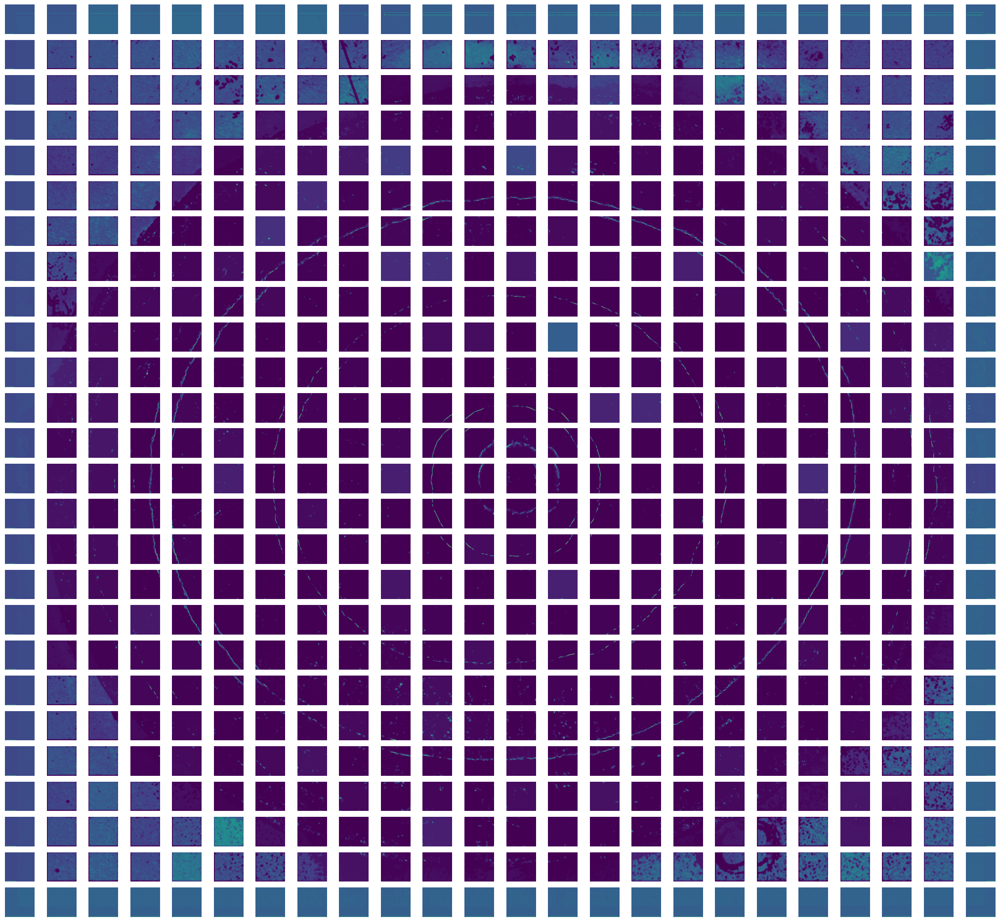

In [25]:
columns = image_patches.shape[1]
rows = image_patches.shape[2]

print(columns, rows)
# retrieve the 1st patches
fig = plt.figure(figsize=(columns, rows)) 
fig.tight_layout()
i = 1
results = []
for col in range(columns):
    for row in range(rows):
        patch = image_patches[0,col,row,]
        patch = tf.reshape(patch, [1, ksize_rows, ksize_cols, 3])        
        res = unet_model.predict([patch], verbose=0)
        res = np.squeeze(res)
        results.append(res)
        fig.add_subplot(columns, rows, i) 
        plt.imshow(res)
        plt.axis('off') 
        strides_rows
        i = i + 1

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


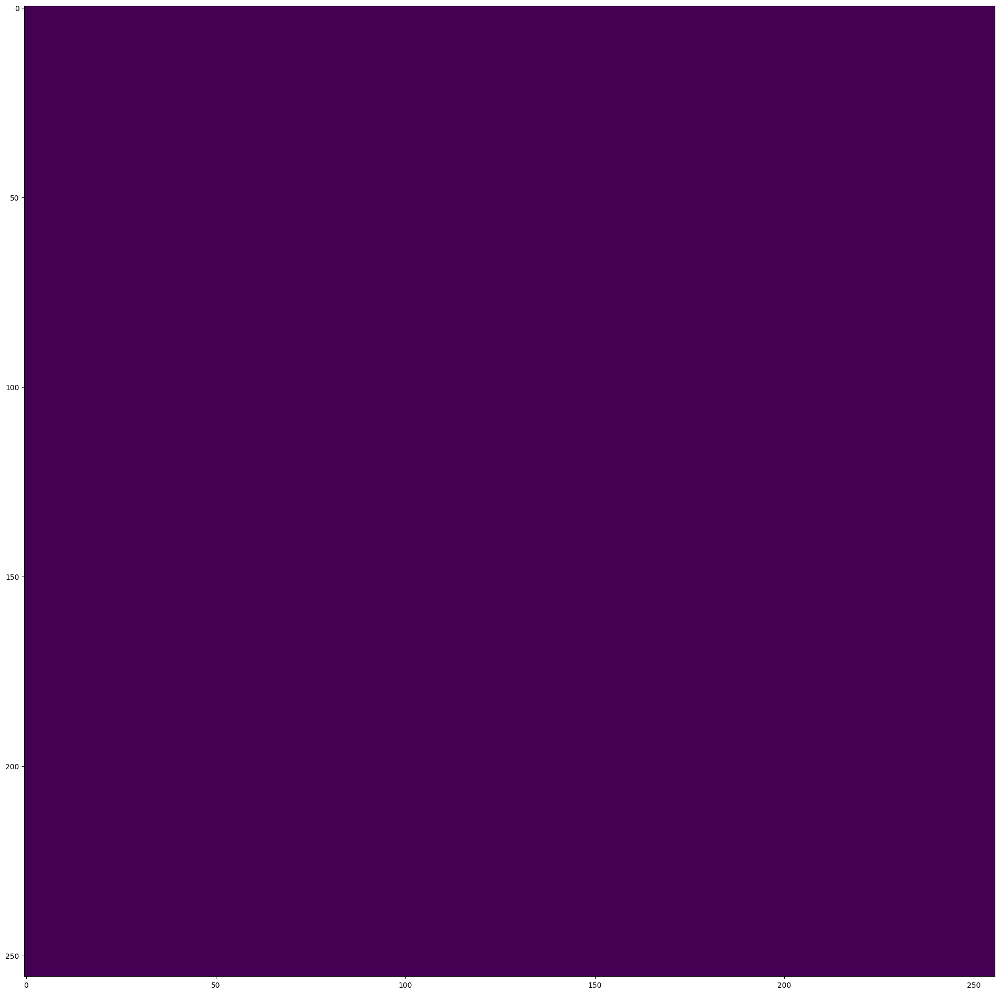

In [58]:
plt.figure(figsize=(columns, rows)) 
output = np.array(results).reshape(columns, rows, ksize_cols, ksize_rows)
img = output[11][16]
img = (img > 0.000005).astype('uint8')
plt.imshow(img)
print(img)

Batch apply classifier

Set the input and output folders and the parameters.

In [59]:
INPUT_FOLDER = "/media/baecker/6b38a953-6650-4da5-94d9-57bd718df733/2025/in/2007_tree_rings/input_images/input/"
OUTPUT_FOLDER = "/media/baecker/6b38a953-6650-4da5-94d9-57bd718df733/2025/in/2007_tree_rings/input_images/out/"
PATCH_SIZE = 256
STRIDE_WIDTH = 256
CHANNELS = 3
PADDING = 'VALID'
THRESHOLD = 0.000005

In [60]:
import cv2
output = np.array(results).reshape(columns, rows, ksize_cols, ksize_rows)
height = list(image_dataset.take(1))[0].shape[0]
width = list(image_dataset.take(1))[0].shape[1] 
reconstructed = np.zeros(height*width).reshape(height, width)
print("image shape", reconstructed.shape)
y = 0
i = 0
for col in range(columns):
    x = 0
    for row in range(rows):   
        print("row: ", row, " col: ", col)
        yEnd = min(y+ksize_rows, height)
        xEnd = min(x+ksize_cols, width)
        deltaY = yEnd - y 
        deltaX = xEnd - x 
        reconstructed[y:yEnd, x:xEnd] = output[col, row, 0:deltaY, 0:deltaX]
        x = x + strides_cols 
    y = y + strides_rows
reconstructed = ((reconstructed > 0.000005).astype('uint8'))*255
reconstructed = np.roll(reconstructed, -(width % strides_cols), axis=0)
reconstructed = np.roll(reconstructed, -(height % strides_rows), axis=1)
cv2.imwrite(output_file, reconstructed)

TIFFReadDirectory: Warning, Unknown field with tag 50838 (0xc696) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50839 (0xc697) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50838 (0xc696) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50839 (0xc697) encountered.
2025-03-06 14:57:52.967282: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
TIFFReadDirectory: Warning, Unknown field with tag 50838 (0xc696) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50839 (0xc697) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50838 (0xc696) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 50839 (0xc697) encountered.


image shape (4998, 4593)
row:  0  col:  0
row:  1  col:  0
row:  2  col:  0
row:  3  col:  0
row:  4  col:  0
row:  5  col:  0
row:  6  col:  0
row:  7  col:  0
row:  8  col:  0
row:  9  col:  0
row:  10  col:  0
row:  11  col:  0
row:  12  col:  0
row:  13  col:  0
row:  14  col:  0
row:  15  col:  0
row:  16  col:  0
row:  17  col:  0
row:  18  col:  0
row:  19  col:  0
row:  20  col:  0
row:  21  col:  0
row:  22  col:  0
row:  23  col:  0
row:  0  col:  1
row:  1  col:  1
row:  2  col:  1
row:  3  col:  1
row:  4  col:  1
row:  5  col:  1
row:  6  col:  1
row:  7  col:  1
row:  8  col:  1
row:  9  col:  1
row:  10  col:  1
row:  11  col:  1
row:  12  col:  1
row:  13  col:  1
row:  14  col:  1
row:  15  col:  1
row:  16  col:  1
row:  17  col:  1
row:  18  col:  1
row:  19  col:  1
row:  20  col:  1
row:  21  col:  1
row:  22  col:  1
row:  23  col:  1
row:  0  col:  2
row:  1  col:  2
row:  2  col:  2
row:  3  col:  2
row:  4  col:  2
row:  5  col:  2
row:  6  col:  2
row:  7  col

2025-03-06 14:57:53.158964: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


True

Function to create patches, predict result patches from input patches and reconstruct a result image.

In [61]:
def createPatches(image_file, patch_size=255, stride_width=196, padding='SAME'):
    image_path_dataset = tf.data.Dataset.from_tensor_slices([image_file])
    image_dataset = image_path_dataset.map(read_image, num_parallel_calls=tf.data.AUTOTUNE).map(prepare_image, num_parallel_calls=tf.data.AUTOTUNE)
    height = list(image_dataset.take(1))[0].shape[0]
    width = list(image_dataset.take(1))[0].shape[1] 
    ksizes = [1, patch_size, patch_size, 1] 
    strides = [1, stride_width, stride_width, 1]
    rates = [1, 1, 1, 1]
    patches = tf.image.extract_patches(images=list(image_dataset.take(1)), sizes=ksizes, strides=strides, rates=rates, padding=padding)
    return patches, height, width

def predictPatches(model, image_patches, patch_size=256, channels=3):
    columns = image_patches.shape[1]
    rows = image_patches.shape[2]
    results = []
    for col in range(columns):
        for row in range(rows):
            patch = image_patches[0,col,row,]
            patch = tf.reshape(patch, [1, patch_size, patch_size, channels])        
            res = model.predict([patch], verbose=0)
            res = np.squeeze(res)
            results.append(res)
    output = np.array(results).reshape(columns, rows, patch_size, patch_size)            
    return output

def reconstructFromPatches(patches, original_image_height, original_image_width, patch_size=256, stride_width=196, threshold=0.000005):
    height, width = original_image_height, original_image_width
    rows = patches.shape[1]
    columns = patches.shape[0]
    reconstructed = np.zeros(height*width).reshape(height, width)    
    y = 0
    for col in range(columns):
        x = 0
        for row in range(rows):   
            yEnd = min(y+patch_size, height)
            xEnd = min(x+patch_size, width)
            deltaY = yEnd - y 
            deltaX = xEnd - x
            reconstructed[y:yEnd, x:xEnd] = patches[col, row, 0:deltaY, 0:deltaX]
            x = x + stride_width 
        y = y + stride_width
    reconstructed = ((reconstructed > threshold).astype('uint8')) * 255
    return reconstructed


def displayPatches(patches, patch_size=256, channels=3):
    if tf.is_tensor(patches):
        columns = patches.shape[1]
        rows = patches.shape[2]
    else:
        columns = patches.shape[0]
        rows = patches.shape[1]
    fig = plt.figure(figsize=(columns, rows)) 
    fig.tight_layout()
    i = 1
    for col in range(columns):
        for row in range(rows):
            if tf.is_tensor(patches):
                patch = patches[0, col, row,]
                patch = tf.reshape(patch, [patch_size, patch_size, channels])        
            else:
                patch = patches[col, row]
            fig.add_subplot(columns, rows, i) 
            plt.axis('off') 
            plt.imshow(patch)
            i = i + 1
    plt.show()

In [62]:
import cv2

def predictImage(image_file, model, patch_size=256, stride_width=196, padding="SAME", channels=3, threshold= 0.000005):
    imagePatches, height, width = createPatches(image_file, patch_size, stride_width, padding)
    maskPatches = predictPatches(model, imagePatches, patch_size, channels)
    mask = reconstructFromPatches(maskPatches, height, width, patch_size, stride_width, threshold)
    return mask

def batchPredict(input_folder, output_folder, patch_size=256, stride_width=196, padding="SAME", channels=3, threshold= 0.000005):
    predict_input_paths = [os.path.join(input_folder, path) for path in os.listdir(input_folder) if path.endswith(".tif")]
    predict_output_paths = [os.path.join(output_folder, path) for path in os.listdir(input_folder) if path.endswith(".tif")]
    paths = zip(predict_input_paths, predict_output_paths)
    counter = 1
    for input_file, output_file in paths:
        print("Processing image " + str(counter) + " of " + str(len(predict_input_paths)))
        print("in: ", input_file)
        print("out: ", output_file)
        mask = predictImage(input_file, unet_model, patch_size, stride_width, padding, channels, threshold)
        cv2.imwrite(output_file, mask)
        counter = counter + 1

Test create patches

2025-03-06 14:59:59.995105: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-03-06 15:00:00.327009: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-03-06 15:00:00.646745: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


6840 6450


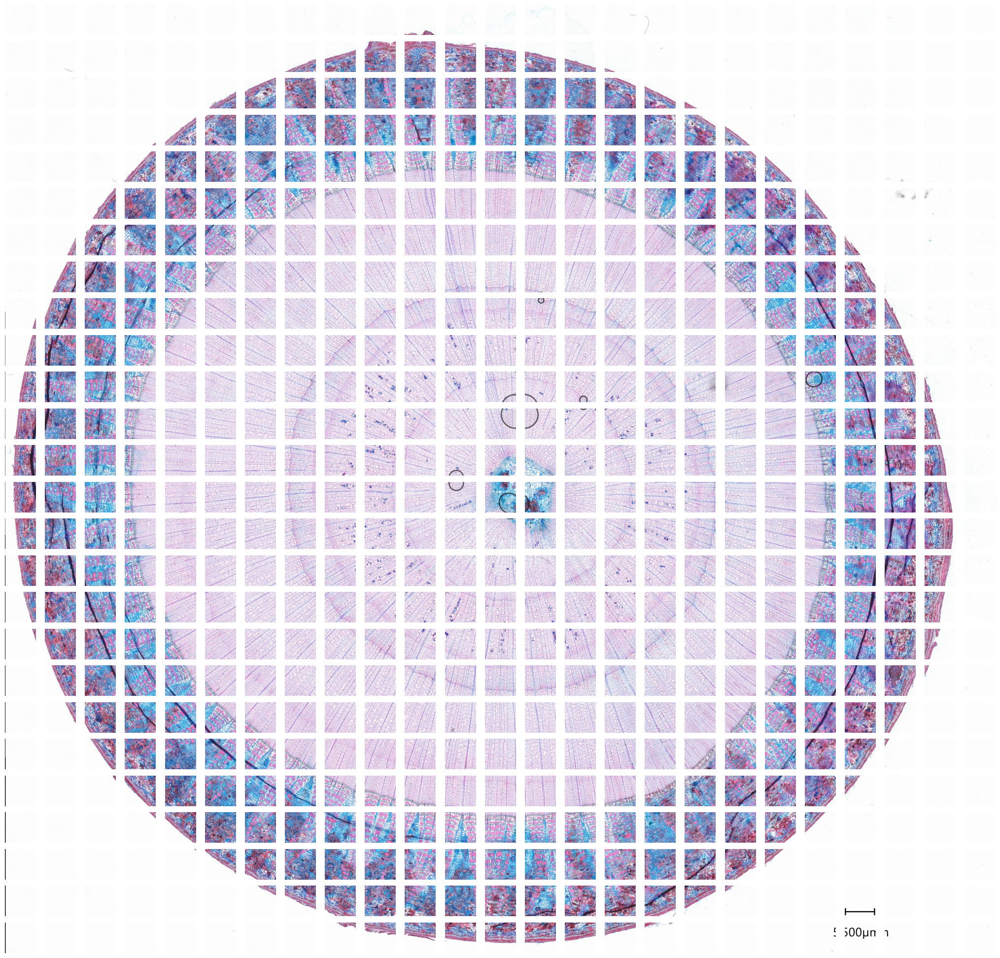

In [65]:
IMAGE_PATH = "/home/khietdang/Documents/khiet/treeRing/input/T 5 b_8µm_x50.tif"
imagePatches, height, width = createPatches(IMAGE_PATH, PATCH_SIZE, STRIDE_WIDTH, PADDING)
print(height, width)
displayPatches(imagePatches, PATCH_SIZE, CHANNELS)

Test predict patches.

In [66]:
output = predictPatches(unet_model, imagePatches, PATCH_SIZE, CHANNELS)

In [ ]:
print(output.shape)

In [ ]:
displayPatches(output, PATCH_SIZE, CHANNELS)

Test reconstruct from patches.

In [ ]:
reconstructed = reconstructFromPatches(output, height, width, PATCH_SIZE, STRIDE_WIDTH, THRESHOLD)
plt.figure(figsize=(8, 8)) 
plt.axis('off') 
plt.imshow(reconstructed)

Test predict image

2025-03-06 14:58:58.679038: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-03-06 14:58:58.973881: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-03-06 14:58:59.269096: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


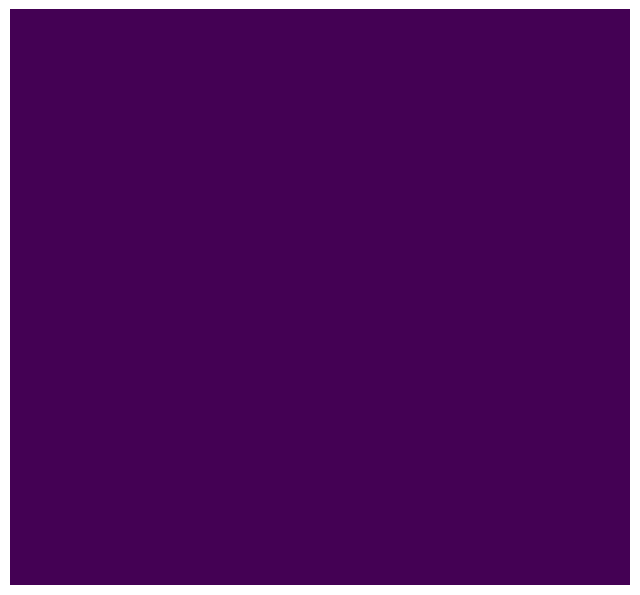

In [64]:
mask = predictImage('/home/khietdang/Documents/khiet/treeRing/input/4 E 1 b_8µm_x50.tif', unet_model, 256, 256, "VALID", 3, 0.000005)
plt.figure(figsize=(8, 8)) 
plt.axis('off') 
plt.imshow(mask)

In [ ]:
print(type(output), output.shape, tf.is_tensor(output))
print(type(imagePatches), imagePatches.shape, tf.is_tensor(imagePatches))

Batch segment the images in a folder

In [ ]:
batchPredict('/media/bae/media/baecker/6b38a953-6650-4da5-94d9-57bd718df733/2025/in/2007_tree_rings/input_images/train/mask/cker/6b38a953-6650-4da5-94d9-57bd718df733/2025/in/2007_tree_rings/unused', '/media/baecker/6b38a953-6650-4da5-94d9-57bd718df733/2025/in/2007_tree_rings/unused/out', PATCH_SIZE, STRIDE_WIDTH, PADDING, CHANNELS, THRESHOLD)

Calculate the ratio of background and foreground pixel in the ground truth.

In [ ]:
FOLDER = "/media/baecker/6b38a953-6650-4da5-94d9-57bd718df733/2025/in/2007_tree_rings/input_images/test/mask/"
input_paths = [os.path.join(FOLDER, path) for path in os.listdir(FOLDER) if path.endswith(".tif")]
total = 256 * 256 * len(input_paths)
positive = 0
for input_file in input_paths:
    img = read_image(input_file)
    channel = img[0:,0:,1]
    pos = channel[channel>0]
    number_positive_pixels = len(pos)
    positive = positive + number_positive_pixels
print(total / positive)
print(positive / total)

In [ ]:
img = read_image("/media/baecker/6b38a953-6650-4da5-94d9-57bd718df733/2025/in/2007_tree_rings/input_images/train/mask/T 5 t_8µm_x50_r0024_c0014.tif")
channel = img[0:,0:,1]
print(channel.shape)
plt.figure(figsize=(8, 8)) 
plt.axis('off') 
plt.imshow(channel)
pos = channel[channel>0]
print(len(pos))